# EX2 - Advanced ML 

---
<br>

### Name and ID:
Student 1: Ron Darmon, XXXXXXXXX
<br>
Student 2: Roei Arpaly, XXXXXXXXX

---

## General

### Imports & Utils

Imports

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go

Plotting utils

In [2]:
from sklearn.metrics import classification_report


def plot_classification_report(y_true, y_pred, title):

    report = pd.DataFrame(classification_report(y_true, y_pred, output_dict=True)).round(2)
    labels = report.columns
    report.loc[['precision', 'recall', 'support'], 'accuracy'] = ['', '', report.loc['support', 'macro avg']]

    fig = go.Figure(data=[go.Table(
        header=dict(values=[''] + list(report.T.columns)),
        cells=dict(values=np.vstack([labels, report.values]), fill_color='#fff')
    )])

    fig.update_layout(
        title=f'Classification Report - {title}',
        height=350, width=800,
        template='plotly_white',
    )

    fig.show()

In [3]:
from sklearn.metrics import confusion_matrix


def plot_confusion_matrix(y_true, y_pred, title):
    
    cm = confusion_matrix(y_true, y_pred)[::-1]

    fig = go.Figure(
        data=[
            go.Heatmap(x=['Predicted 0', 'Predicted 1'],
                      y=['Actual 0', 'Actual 1'],
                      z=cm,
                      text=cm,
                      texttemplate="%{text}",
                      textfont={"size": 20},
                      xgap=4, ygap=4,
                      colorscale='Viridis',
                      )
            ],
    )

    fig.update_layout(
        title=f'Confusion Matrix - {title}',
        xaxis_title='Predicted label',
        yaxis_title='True label',
        height=600, width=600,
        template='plotly_white',
        )    

    fig.show()

In [4]:
from sklearn.decomposition import PCA


def plot_decision_boundaries(classifier, X, y, title):

    pca = PCA(n_components=2)
    X_reduced = pca.fit_transform(X)

    # Generate a meshgrid for visualization
    x_min, x_max = X_reduced[:, 0].min() - 1, X_reduced[:, 0].max() + 1
    y_min, y_max = X_reduced[:, 1].min() - 1, X_reduced[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.1), np.arange(y_min, y_max, 0.1))

    X_reduced_inverse = pca.inverse_transform(np.c_[xx.ravel(), yy.ravel()])
    mesh_predictions = classifier.predict(X_reduced_inverse)
    mesh_predictions = mesh_predictions.reshape(xx.shape)


    # filled contour
    fig = go.Figure(data=go.Contour(
        x=np.arange(x_min, x_max, 0.1),
        y=np.arange(y_min, y_max, 0.1),
        z=mesh_predictions,
        colorscale='Viridis', opacity=0.6,
        line=dict(color='rgb(0,128,128,0.05)', width=1),
        showscale=False
    ))

    # original points
    fig.add_trace(go.Scatter(
        x=X_reduced[:, 0], y=X_reduced[:, 1],
        mode='markers',
        marker=dict(color=y, colorscale='Viridis',
            line=dict(color='black', width=1),
        ),
        name='Data Points'
    ))

    fig.update_layout(
        height=600, width=600,
        template='plotly_white',
        title=dict(text=f'Decision Boundaries - {title}', x=0.5, y=0.9, font=dict(size=18)),
        xaxis=dict(title='Feature 1'),
        yaxis=dict(title='Feature 2'),
        showlegend=False
    )

    fig.show()

In [5]:
from sklearn.model_selection import learning_curve


def plot_learning_curve(estimator, X, y, title):
    train_sizes, train_scores, test_scores = learning_curve(
        estimator, X, y, cv=5, scoring='accuracy'
    )
    
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    
    fig = go.Figure()

    fig.add_trace(go.Scatter(
        x=train_sizes, y=test_scores_mean,
        mode='lines+markers',
        name='Test score',
        line=dict(color='#ff7f0e'),
        marker=dict(color='#ff7f0e'),
    ))

    fig.add_trace(go.Scatter(
        x=train_sizes,
        y=test_scores_mean - test_scores_std,
        mode='lines',
        name='Test score - Std',
        line=dict(color='#ff7f0e', width=0),
        showlegend=False
    ))
    
    fig.add_trace(go.Scatter(
        x=train_sizes,
        y=test_scores_mean + test_scores_std,
        mode='lines',
        name='Test score + Std',
        line=dict(color='#ff7f0e', width=0),
        fill='tonexty',
        fillcolor='rgba(255, 127, 14, 0.1)',
        showlegend=False
    ))

    fig.add_trace(go.Scatter(
        x=train_sizes, y=train_scores_mean,
        mode='lines+markers',
        name='Training score',
        line=dict(color='#1f77b4'),
        marker=dict(color='#1f77b4'),
    ))

    fig.add_trace(go.Scatter(
        x=train_sizes,
        y=train_scores_mean - train_scores_std,
        mode='lines',
        name='Training score - Std',
        line=dict(color='#1f77b4', width=0),
        showlegend=False
    ))
    
    fig.add_trace(go.Scatter(
        x=train_sizes,
        y=train_scores_mean + train_scores_std,
        mode='lines',
        name='Training score + Std',
        line=dict(color='#1f77b4', width=0),
        fill='tonexty',
        fillcolor='rgba(31, 119, 180, 0.1)',
        showlegend=False
    ))    
    
    
    fig.update_layout(
        height=500, width=1200,
        title=dict(text=f"Learning Curve - {title}", x=0.5),
        xaxis_title="Training Examples",
        yaxis_title="Score",
        template='plotly_white',
        legend=dict(orientation='h', x=.5, y=1, xanchor='center', yanchor='bottom')
    )
    
    fig.show()

---

## Part 0: Generate datasets

### Dataset

In [6]:
import matplotlib.pyplot as plt
from sklearn.datasets import make_blobs, make_circles

# Generate blobs dataset
X_blobs, y_blobs = make_blobs(n_samples=10000, centers=2, n_features=10, cluster_std=5, random_state=42)

# Generate circles dataset
X_circles, y_circles = make_circles(n_samples=10000, noise=0.075, random_state=42)

### Train Test Split

In [7]:
from sklearn.model_selection import train_test_split

X_train_blobs, X_test_blobs, y_train_blobs, y_test_blobs = train_test_split(X_blobs, y_blobs, test_size=0.2, random_state=42)
X_train_circles, X_test_circles, y_train_circles, y_test_circles = train_test_split(X_circles, y_circles, test_size=0.2, random_state=42)

### EDA

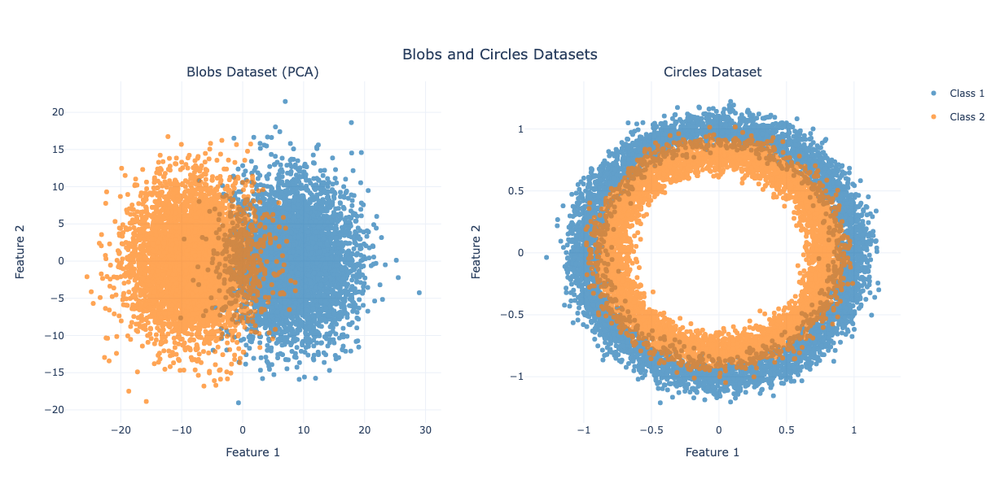

In [8]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

fig = make_subplots(rows=1, cols=2, subplot_titles=("Blobs Dataset (PCA)", "Circles Dataset"))

pca = PCA(n_components=2)
X_pca_blobs = pca.fit_transform(X_blobs)

names, colors = ['Class 1', 'Class 2'], ['#1f77b4', '#ff7f0e']
for i, group in enumerate(np.unique(y_blobs)):

  X_blobs_group = X_pca_blobs[y_blobs == group]
  X_circles_group = X_circles[y_circles == group]
  fig.add_trace(go.Scatter(x=X_blobs_group[:, 0], y=X_blobs_group[:, 1], mode='markers',
                           marker_color=colors[i], name=names[i], legendgroup=i, opacity=0.7), row=1, col=1)
  fig.add_trace(go.Scatter(x=X_circles_group[:, 0], y=X_circles_group[:, 1], mode='markers',
                           marker_color=colors[i], legendgroup=i, opacity=0.7, showlegend=False), row=1, col=2)

fig.update_xaxes(title_text="Feature 1", row=1, col=1, zeroline=False)
fig.update_xaxes(title_text="Feature 1", row=1, col=2, zeroline=False)
fig.update_yaxes(title_text="Feature 2", row=1, col=1, zeroline=False)
fig.update_yaxes(title_text="Feature 2", row=1, col=2, zeroline=False)

fig.update_layout(title=dict(text='Blobs and Circles Datasets', x=0.5, y=0.9, font=dict(size=18)),
                  height=600, width=1200,
                  template='plotly_white',
                  )

fig.show()

---

## Part 1:  Gradient Boosting Regression Trees (GBRT)

### Implementation:

In [9]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error

from sklearn.base import BaseEstimator
from sklearn.utils.validation import check_X_y, check_array, check_is_fitted
from sklearn.utils.multiclass import unique_labels


class GBRT(BaseEstimator):
    def __init__(self, n_estimators=100, learning_rate=0.1, max_depth=3):
        self.n_estimators = n_estimators
        self.learning_rate = learning_rate
        self.max_depth = max_depth
        
    def fit(self, X, y):
        X, y = check_X_y(X, y)
        X, y = np.asarray(X), np.asarray(y)
        self.classes_ = unique_labels(y)

        self.estimators_ = []
        self.n_features_in_ = X.shape[1]
        self.base_pred_ = np.mean(y)  # Initial prediction is the mean of y
        residuals = y - self.base_pred_  # Calculate initial residuals
        
        for _ in range(self.n_estimators):
            estimator = DecisionTreeRegressor(max_depth=self.max_depth)
            estimator.fit(X, residuals)
            self.estimators_.append(estimator)
            
            # Update residuals
            pred = estimator.predict(X)
            residuals -= self.learning_rate * pred
        return self
            
    def predict(self, X):
        check_is_fitted(self)
        X = check_array(X)
        X = np.asarray(X)

        # Initialize predictions with base prediction
        y_pred = np.full(X.shape[0], self.base_pred_)
        for estimator in self.estimators_:
            y_pred += self.learning_rate * estimator.predict(X)
        return np.where(y_pred >= 0.5, 1, 0)

    def score(self, X, y):
        y = np.asarray(y)
        y_pred = self.predict(X)
        return mean_squared_error(y, y_pred)

    def get_params(self, deep=True):
      return {k: v for k, v in self.__dict__.items()}

In [10]:
from sklearn.utils.estimator_checks import check_estimator
check_estimator(GBRT())  # passes

### Demonstration:

#### Blobs

In [11]:
gbrt = GBRT(n_estimators=100, learning_rate=0.1, max_depth=3)

gbrt.fit(X_train_blobs, y_train_blobs)
y_pred_blobs = gbrt.predict(X_test_blobs)

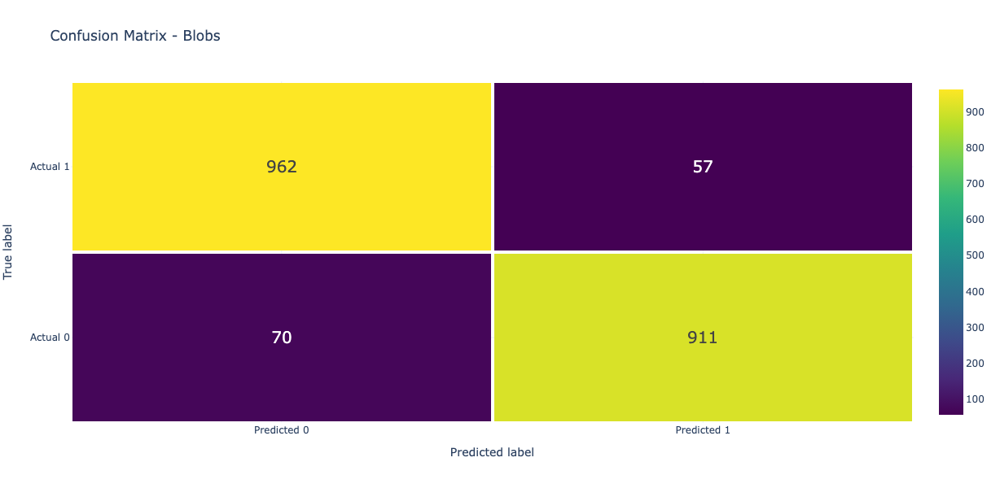

In [12]:
plot_confusion_matrix(y_test_blobs, y_pred_blobs, 'Blobs')

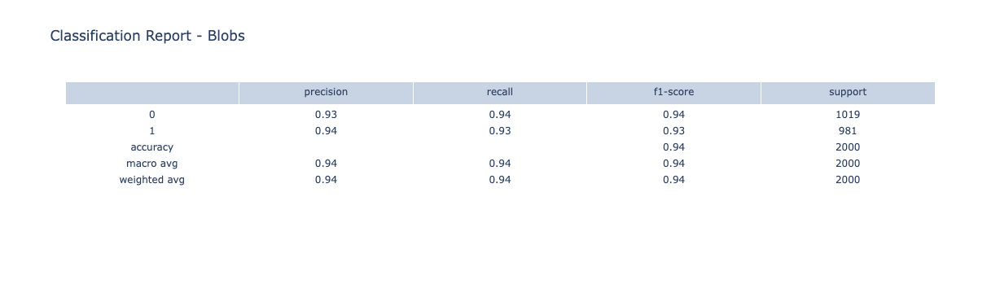

In [13]:
plot_classification_report(y_true=y_test_blobs, y_pred=y_pred_blobs, title='Blobs')

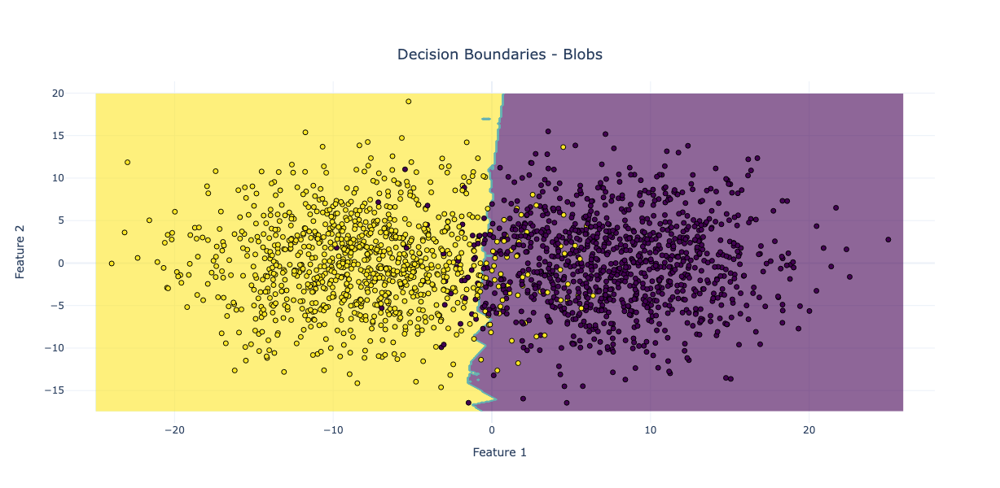

In [14]:
plot_decision_boundaries(gbrt, X_test_blobs, y_test_blobs, 'Blobs')

---

#### Circles

In [15]:
gbrt = GBRT(n_estimators=100, learning_rate=0.1, max_depth=3)

gbrt.fit(X_train_circles, y_train_circles)
y_pred_circles = gbrt.predict(X_test_circles)

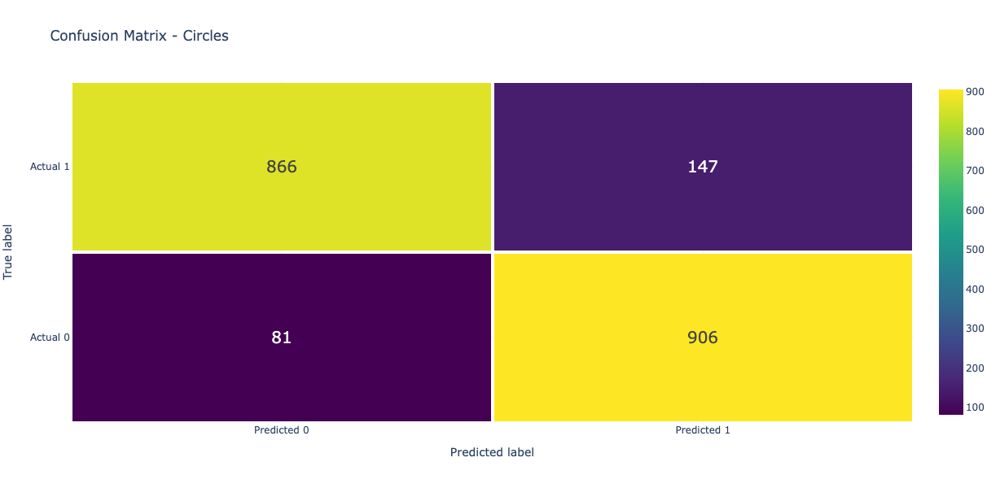

In [16]:
plot_confusion_matrix(y_test_circles, y_pred_circles, 'Circles')

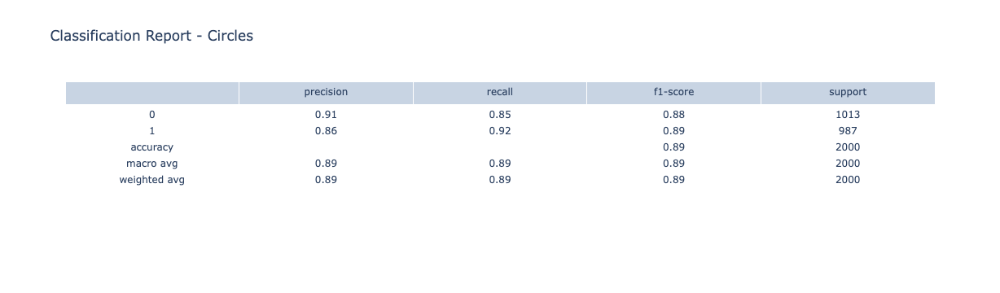

In [17]:
plot_classification_report(y_true=y_test_circles, y_pred=y_pred_circles, title='Circles')

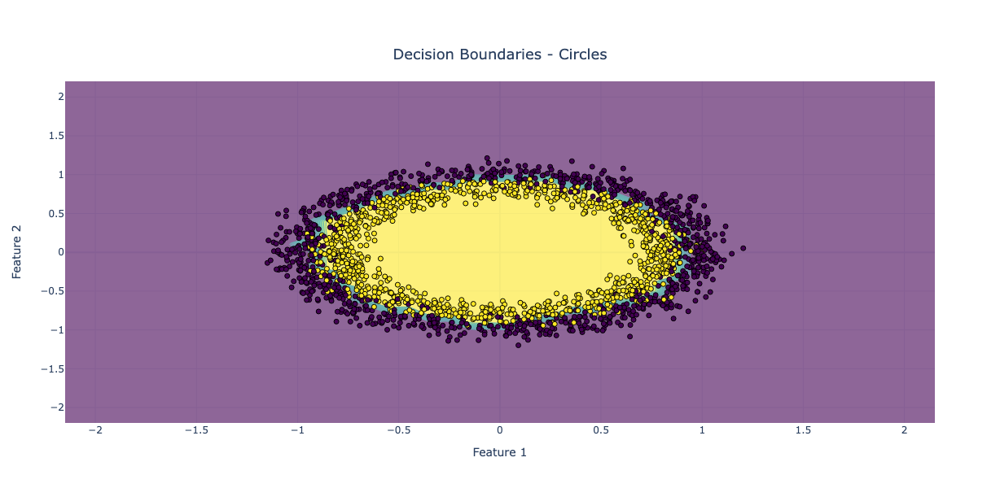

In [18]:
plot_decision_boundaries(gbrt, X_test_circles, y_test_circles, 'Circles')

### Experiments: 

#### Blobs

Learning curve

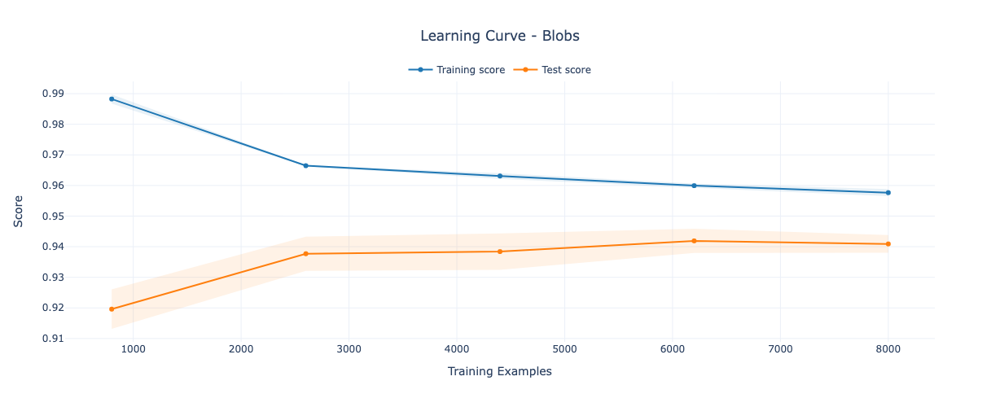

In [19]:
gbrt = GBRT()
plot_learning_curve(gbrt, X_blobs, y_blobs, 'Blobs')

Gridsearch

In [20]:
from sklearn.model_selection import GridSearchCV, ShuffleSplit

param_grid = {
    'n_estimators': [10, 50, 100],
    'learning_rate': [0.01, 0.05, 0.1],
    'max_depth': [1, 3],
}

ss = ShuffleSplit(n_splits=1, test_size=0.2, random_state=0)
gbrt_grid = GridSearchCV(GBRT(), param_grid, cv=ss, scoring='accuracy', refit='accuracy', n_jobs=-1)
gbrt_grid.fit(X_train_blobs, y_train_blobs)
y_pred_blobs = gbrt_grid.predict(X_test_blobs)

In [21]:
gbrt_grid.best_params_

{'learning_rate': 0.05, 'max_depth': 3, 'n_estimators': 100}

Gridsearch Evaluation

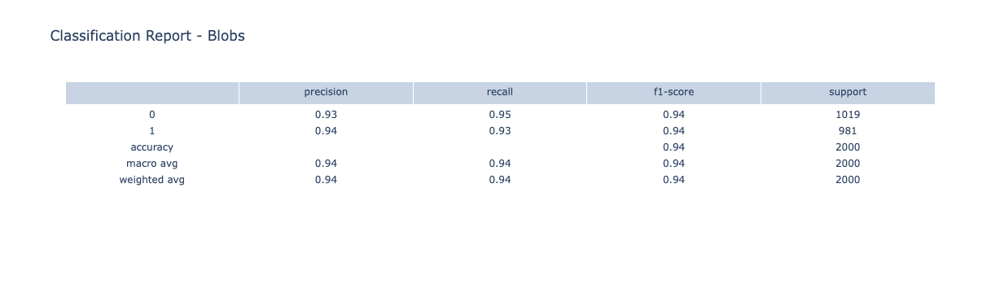

In [22]:
plot_classification_report(y_test_blobs, y_pred_blobs, 'Blobs')

---

#### Circles

Learning curve

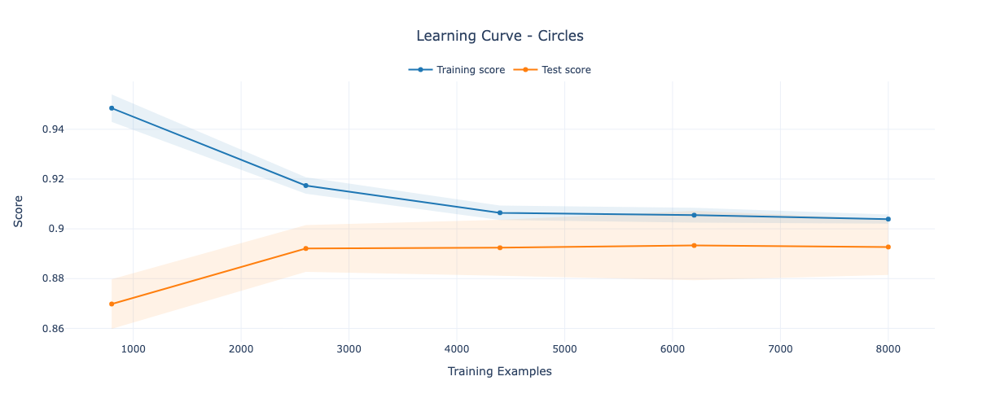

In [23]:
gbrt = GBRT()
plot_learning_curve(gbrt, X_circles, y_circles, 'Circles')

Gridsearch

In [24]:
from sklearn.model_selection import GridSearchCV, ShuffleSplit

param_grid = {
    'n_estimators': [100, 200],
    'learning_rate': [0.01, 0.05, 0.1],
    'max_depth': [2, 3, 4],
}

ss = ShuffleSplit(n_splits=1, test_size=0.2, random_state=0)
gbrt_grid = GridSearchCV(GBRT(), param_grid, cv=ss, scoring='accuracy', refit='accuracy', n_jobs=-1)
gbrt_grid.fit(X_train_circles, y_train_circles)
y_pred_circles = gbrt_grid.predict(X_test_circles)

In [25]:
gbrt_grid.best_params_

{'learning_rate': 0.05, 'max_depth': 4, 'n_estimators': 200}

Gridsearch evaluation

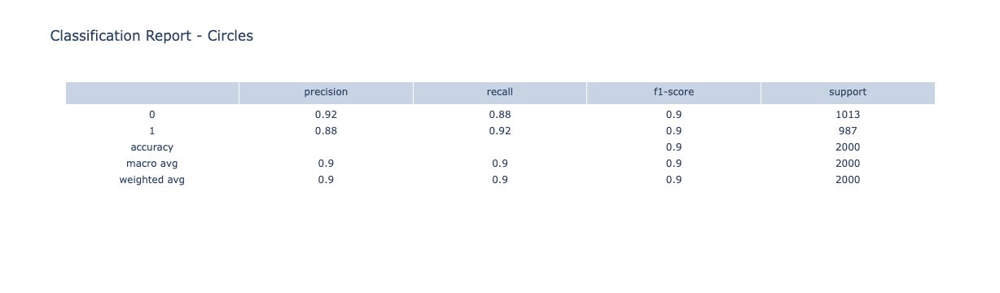

In [26]:
plot_classification_report(y_test_circles, y_pred_circles, 'Circles')

---

## Part 2: AdaBoost

### Implementation:

In [27]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score

from sklearn.base import BaseEstimator, ClassifierMixin
from sklearn.utils.validation import check_X_y, check_array, check_is_fitted
from sklearn.utils.multiclass import unique_labels


class AdaBoost(BaseEstimator):
    def __init__(self, n_estimators=100, learning_rate=0.1):
        self.n_estimators = n_estimators
        self.learning_rate = learning_rate
        
    def fit(self, X, y):
        X, y = check_X_y(X, y)
        X, y = np.asarray(X), np.asarray(y)

        y = (y - 0.5) * 2  # Convert to {-1,1} labels

        self.classes_ = unique_labels(y)
        self.n_features_in_ = X.shape[1]

        self.estimators_ = []
        self.alphas_ = []
        sample_weight = np.full(X.shape[0], 1 / X.shape[0])
  
        for _ in range(self.n_estimators):
            estimator = DecisionTreeClassifier(max_depth=1)  # Tree Stump
            estimator.fit(X, y, sample_weight=sample_weight)
            y_pred = estimator.predict(X)
            
            weighted_error = np.sum(sample_weight * np.not_equal(y_pred, y))
            weighted_error = max(weighted_error, 1e-10)  # Avoid div by zero
            
            alpha = 1e-10
            if weighted_error <= 0.5:
                alpha = 0.5 * np.log((1 - weighted_error) / weighted_error)
                sample_weight *= np.exp(alpha * (-y_pred * y))
                sample_weight /= (2 * np.sqrt((1 - weighted_error) * weighted_error))
                
            self.estimators_.append(estimator)
            self.alphas_.append(alpha)
                
        return self

    def predict(self, X, threshold=0.5):
        check_is_fitted(self)
        X = check_array(X)
        X = np.asarray(X)
  
        y_preds = np.asarray([estimator.predict(X) for estimator in self.estimators_])
        weighted_preds = np.dot(self.alphas_, y_preds)
        y_pred = (weighted_preds >= threshold).astype(np.uint8)
        return y_pred

    def score(self, X, y):
        y = np.asarray(y)
        y_pred = self.predict(X)
        return accuracy_score(y, y_pred)

    def get_params(self, deep=True):
      return {k: v for k, v in self.__dict__.items()}

In [28]:
from sklearn.utils.estimator_checks import check_estimator
check_estimator(AdaBoost())  # passes

### Demonstration:

#### Blobs

In [29]:
adaboost = AdaBoost()
adaboost.fit(X_train_blobs, y_train_blobs)
y_pred_blobs = adaboost.predict(X_test_blobs)

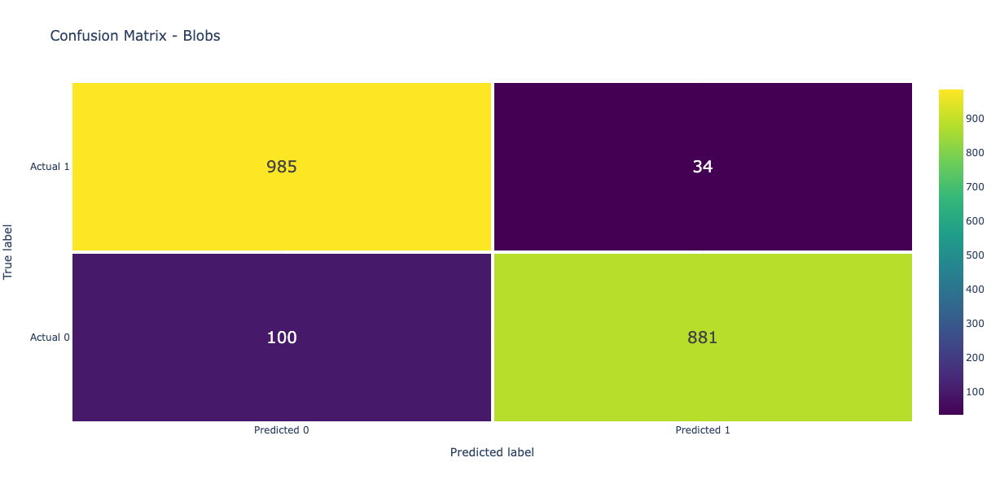

In [30]:
plot_confusion_matrix(y_test_blobs, y_pred_blobs, 'Blobs')

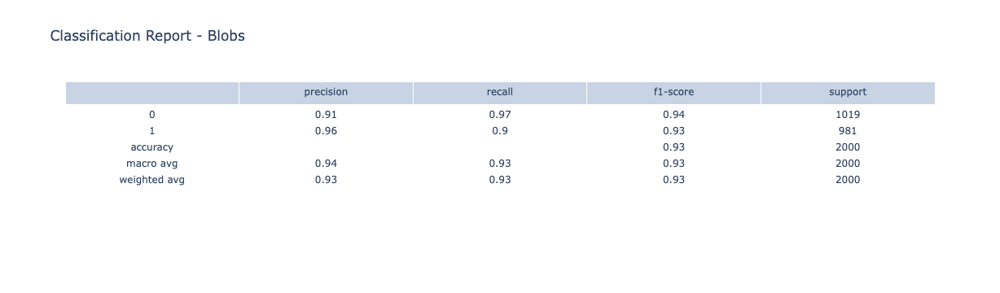

In [31]:
plot_classification_report(y_true=y_test_blobs, y_pred=y_pred_blobs, title='Blobs')

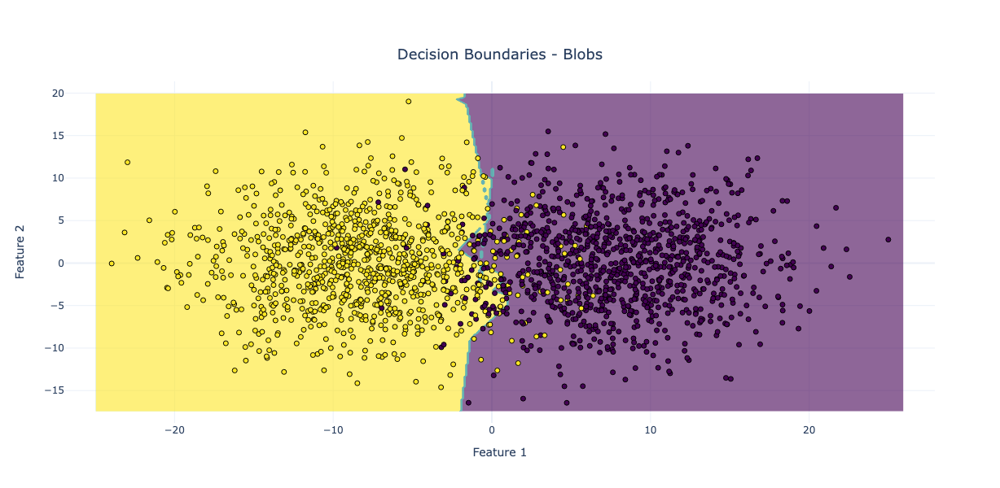

In [32]:
plot_decision_boundaries(adaboost, X_test_blobs, y_test_blobs, 'Blobs')

---

#### Circles

In [33]:
adaboost = AdaBoost()

adaboost.fit(X_train_circles, y_train_circles)
y_pred_circles = adaboost.predict(X_test_circles)

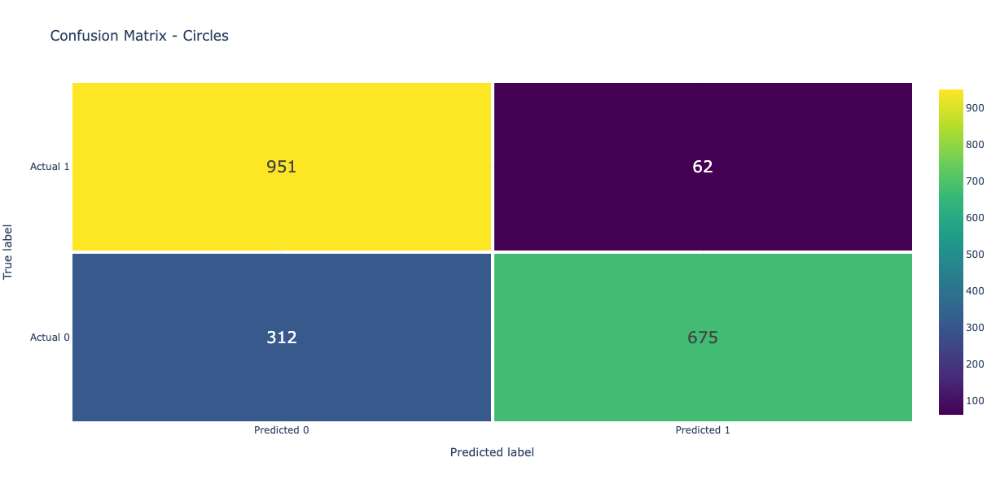

In [34]:
plot_confusion_matrix(y_test_circles, y_pred_circles, 'Circles')

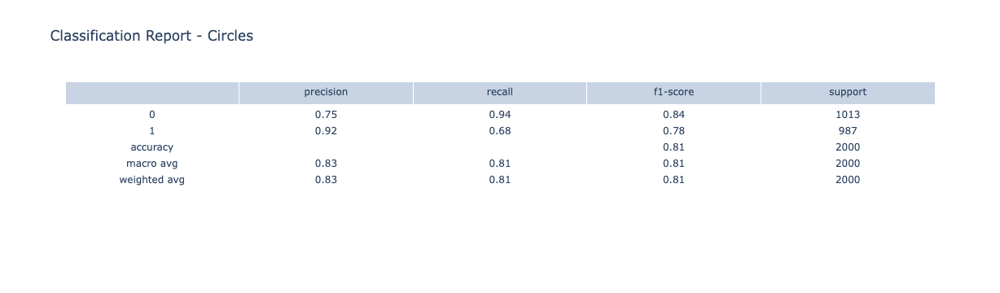

In [35]:
plot_classification_report(y_true=y_test_circles, y_pred=y_pred_circles, title='Circles')

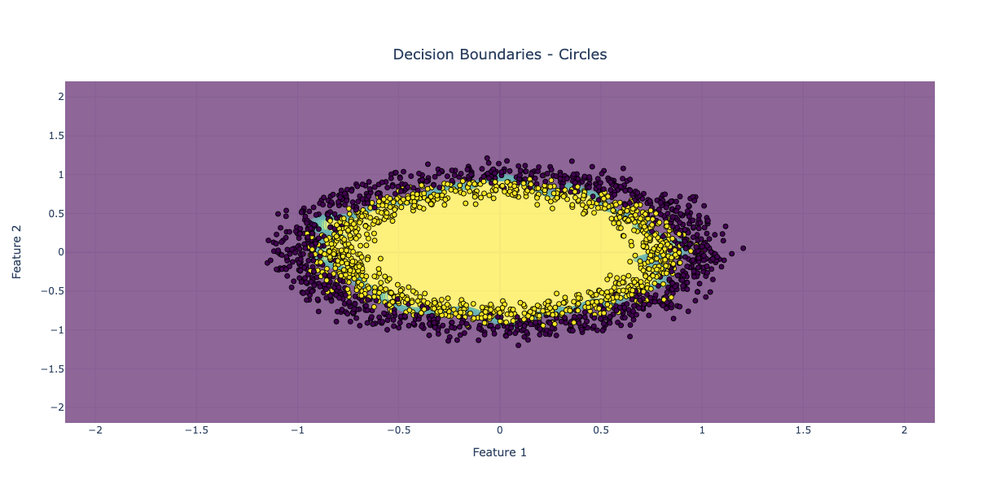

In [36]:
plot_decision_boundaries(adaboost, X_test_circles, y_test_circles, 'Circles')

### Experiments: 

#### Blobs

Learning Curve

In [37]:
adaboost = AdaBoost()
plot_learning_curve(adaboost, X_blobs, y_blobs, 'Blobs')

Evaluation

GridSearch

In [38]:
param_grid = {
    'n_estimators': [10, 50, 100, 200],
}

ss = ShuffleSplit(n_splits=1, test_size=0.2, random_state=0)
adaboost_grid = GridSearchCV(AdaBoost(), param_grid, cv=ss, scoring='accuracy', refit='accuracy', n_jobs=-1)
adaboost_grid.fit(X_train_blobs, y_train_blobs)
y_pred_blobs = adaboost_grid.predict(X_test_blobs)

In [39]:
adaboost_grid.best_params_

{'n_estimators': 200}

GridSearch Evaluation

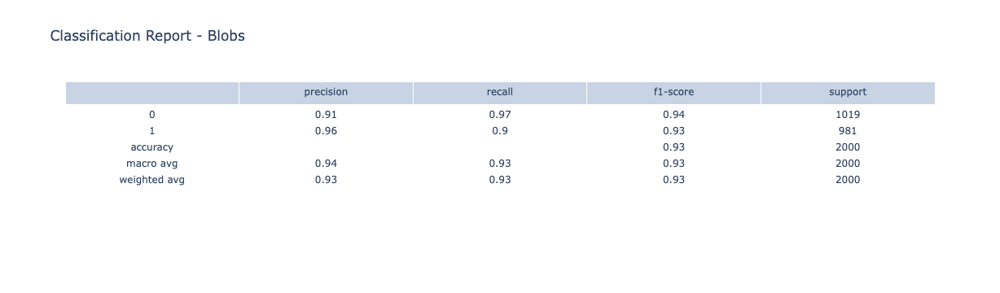

In [40]:
plot_classification_report(y_test_blobs, y_pred_blobs, 'Blobs')

---

#### Circles

Learning Curve

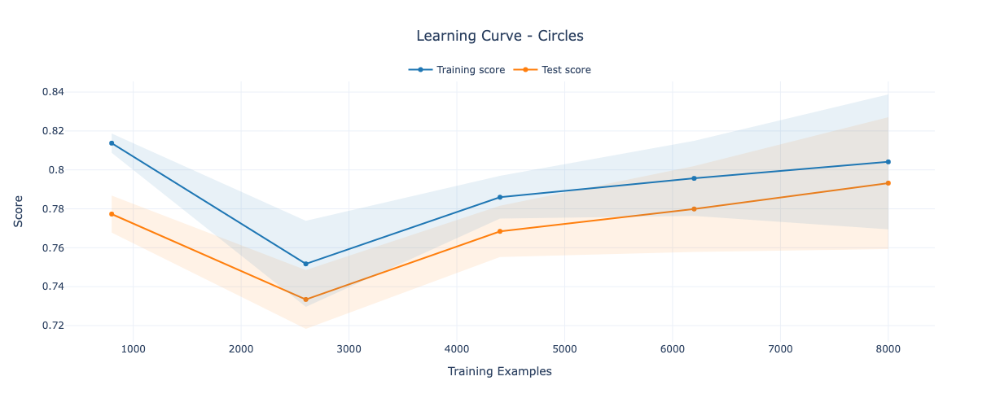

In [41]:
adaboost = AdaBoost()
plot_learning_curve(adaboost, X_circles, y_circles, 'Circles')

Gridsearch

In [42]:
param_grid = {
    'n_estimators': [100, 200, 500],
}

ss = ShuffleSplit(n_splits=1, test_size=0.2, random_state=0)
adaboost_grid = GridSearchCV(AdaBoost(), param_grid, cv=ss, scoring='accuracy', refit='accuracy', n_jobs=-1)
adaboost_grid.fit(X_train_circles, y_train_circles)
y_pred_circles = adaboost_grid.predict(X_test_circles)

In [43]:
adaboost_grid.best_params_

{'n_estimators': 500}

GridSearch Evaluation

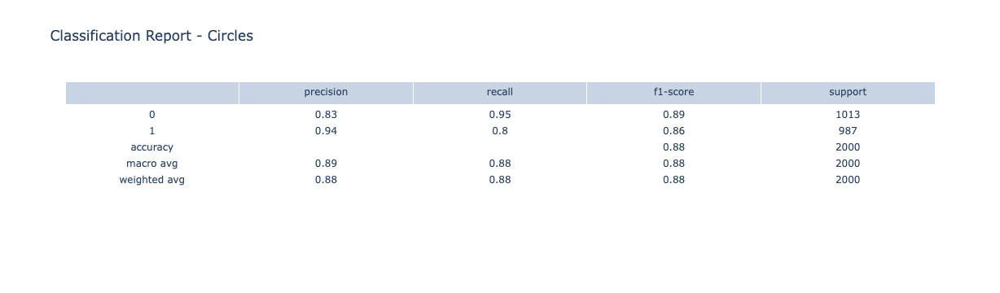

In [44]:
plot_classification_report(y_test_circles, y_pred_circles, 'Circles')

---

## Part 4: Summary - In the PDF

---